In [75]:
import numpy as np
import pandas as pd

import yfinance as yf #only for data in a daily basis, not work for financial data any more(under decryption by Github:https://github.com/ranaroussi/yfinance/issues/1407)
from yahooquery import Ticker #replacement for yf
import yahoo_fin.stock_info as si
from pandas_datareader import data as pdr


import scipy.stats
import seaborn as sns
import math

import matplotlib.pyplot as plt 
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode() #show pictures

import networkx as nx #neural network plot


In [ ]:
#data import -- si.tickers, yf.download, Ticker() #depend on its efficiency 

#data manipulation -- simple sieve， 

#data visulization -- sns.heatmap, Neural Network, Candlestick, 

In [2]:



#part 1: data manipulation




In [3]:
#choose stock market
#si.tickers_dow();
#si.tickers_sp500();
#lets try nasdaq stocks
ticker_list = si.tickers_nasdaq();         
ticker_str = " ".join(ticker_list);

In [4]:
#download muti stocks' data
Multi_Stock = yf.download(tickers=ticker_str,period='5y',interval='1d',rounding=True);

[*********************100%***********************]  5346 of 5346 completed

64 Failed downloads:
- ARIZR: Period '5y' is invalid, must be one of ['1d', '5d']
- HSPOR: Period '5y' is invalid, must be one of ['1d', '5d']
- FXCOR: Period '5y' is invalid, must be one of ['1d', '5d']
- MCAFR: Period '5y' is invalid, must be one of ['1d', '5d']
- BSGAR: Period '5y' is invalid, must be one of ['1d', '5d']
- KYCHR: Period '5y' is invalid, must be one of ['1d', '5d']
- ACAXR: Period '5y' is invalid, must be one of ['1d', '5d']
- ZXZZT: Period '5y' is invalid, must be one of ['1d', '5d']
- ALSAR: Period '5y' is invalid, must be one of ['1d', '5d']
- NWFL: No data found for this date range, symbol may be delisted
- IMAQR: No data found for this date range, symbol may be delisted
- WTMAR: Period '5y' is invalid, must be one of ['1d', '5d']
- CSLMR: Period '5y' is invalid, must be one of ['1d', '5d']
- QOMOR: Period '5y' is invalid, must be one of ['1d', '5d']
- MCACR: Period '5y' is invalid, must 

In [5]:
#df is Daily_highest_return_dataframe
df = Multi_Stock['High']-Multi_Stock['Low']; 

In [6]:
#simple sieve
#get rid of unnecessary stocks(fluctuation is too small) by value x with at least n days
#return adjusted df and a list of unnecessary stocks
x=1; n=60;
list_first = df.columns.values.tolist();
df = df.loc[:,(df > x).sum() >= n];

list_changed = df.columns.values.tolist();
list_drop = list(set(list_first) - set(list_changed));

In [7]:
df

,AADI,AADR,AAL,AAOI,AAON,AAPL,AAXJ,ABCB,ABCL,ABEO,...,ZIONP,ZLAB,ZM,ZNTL,ZS,ZUMZ,ZVRA,ZYME,ZYNE,ZYXI
Date,,,,,,,,,,,,,,,,,,,,,
2018-03-23,1.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-03-26,1.50,1.09,1.40,2.330,0.90,1.67,1.50,1.25,NaN,23.75,...,0.00,1.83,NaN,NaN,3.64,1.10,7.20,1.26,0.790,0.20
2018-03-27,1.50,1.54,1.80,1.089,0.70,2.06,1.66,1.80,NaN,36.25,...,0.48,0.69,NaN,NaN,2.00,1.30,6.38,0.64,0.420,0.44
2018-03-28,0.00,0.96,1.21,1.020,0.75,1.21,0.88,1.17,NaN,29.00,...,0.33,0.43,NaN,NaN,1.19,0.95,7.74,1.01,0.400,0.01
2018-03-29,6.00,1.31,1.40,1.310,1.15,1.22,1.22,0.85,NaN,31.25,...,0.44,1.09,NaN,NaN,1.65,0.90,11.20,0.66,0.390,0.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-16,0.64,0.79,0.60,0.105,5.81,4.82,1.21,3.95,0.30,0.16,...,1.46,3.94,2.33,1.68,3.26,1.05,0.24,0.59,0.046,0.30
2023-03-17,0.63,0.15,0.50,0.250,2.18,2.46,0.59,2.19,0.27,0.20,...,2.45,3.36,2.03,0.88,4.04,1.21,0.31,0.29,0.030,0.47
2023-03-20,0.21,0.24,0.34,0.104,1.58,3.67,0.64,1.92,0.32,0.19,...,1.56,3.37,1.93,0.77,3.24,1.24,0.30,0.59,0.020,0.43


In [8]:
len(list_drop)

2919

In [9]:
#correlation matrix(upper tirangle)
corr_matrix = df.corr(method='pearson')
corr_df=pd.DataFrame(np.triu(corr_matrix, k=1))
corr_df.columns = df.columns.values.tolist()
corr_df.index = df.columns.values.tolist()
corr_df

,AADI,AADR,AAL,AAOI,AAON,AAPL,AAXJ,ABCB,ABCL,ABEO,...,ZIONP,ZLAB,ZM,ZNTL,ZS,ZUMZ,ZVRA,ZYME,ZYNE,ZYXI
AADI,0.0,0.098523,0.211833,0.333831,-0.177675,-0.200345,-0.001942,-0.000432,0.209040,0.288911,...,-0.065743,-0.046352,0.362035,0.178082,-0.131746,-0.016986,0.353405,-0.066598,0.091470,-0.158302
AADR,0.0,0.000000,0.349612,0.215544,0.239279,0.193011,0.517819,0.300941,0.094999,0.145218,...,0.196129,0.083399,0.229643,0.155949,0.134950,0.249821,0.137826,0.165893,0.016158,0.110042
AAL,0.0,0.000000,0.000000,0.289093,0.129335,-0.070105,0.351778,0.209619,0.235130,0.324993,...,0.199030,-0.050850,0.133282,0.225169,-0.067166,0.143564,0.305853,0.131763,0.186724,0.060189
AAOI,0.0,0.000000,0.000000,0.000000,-0.187637,-0.343685,-0.006482,-0.065575,0.425338,0.590262,...,-0.016972,-0.256456,0.241906,0.095945,-0.327191,-0.139149,0.573468,0.020137,0.265796,-0.130573
AAON,0.0,0.000000,0.000000,0.000000,0.000000,0.383395,0.455248,0.324938,0.006834,-0.237876,...,0.332896,0.213159,0.110968,-0.035399,0.235890,0.335116,-0.283772,0.170631,-0.151756,0.270748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZUMZ,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.225569,0.236523,-0.141211,0.200960
ZVRA,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.116302,0.310526,-0.303607
ZYME,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.053725,0.364572
ZYNE,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.054540


In [10]:



#part 2: visualization
#just for fun




<Figure size 640x480 with 0 Axes>

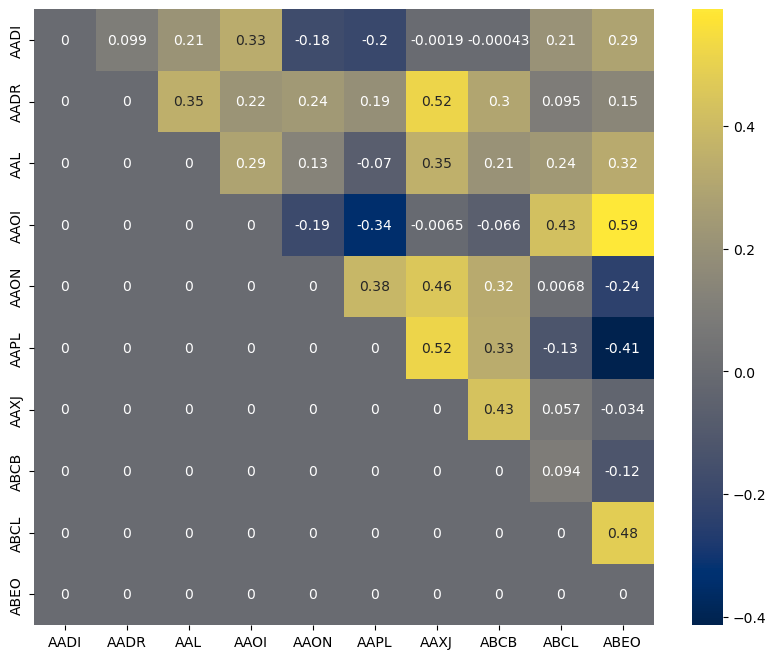

<Figure size 640x480 with 0 Axes>

In [11]:
#sns.heatmap
#matrix of first 10 stocks
new_matrix = corr_df.iloc[:10,:10]
plt.figure(figsize=(10, 8))
sns.heatmap(new_matrix, annot=True,cmap='cividis')
plt.figure()

In [12]:
#matrix
New_corr_df = df.corr(method='pearson')

In [13]:
first_50 = corr_df.iloc[:50,:50];

In [14]:
stocks = first_50.index.values;
New_matrix = np.asmatrix(corr_df)
New_matrix[0:50,0:50];

In [15]:
G = nx.from_numpy_matrix(New_matrix[0:50,0:50]);
G = nx.relabel_nodes(G,lambda x: stocks[x]);
G.edges(data=True);

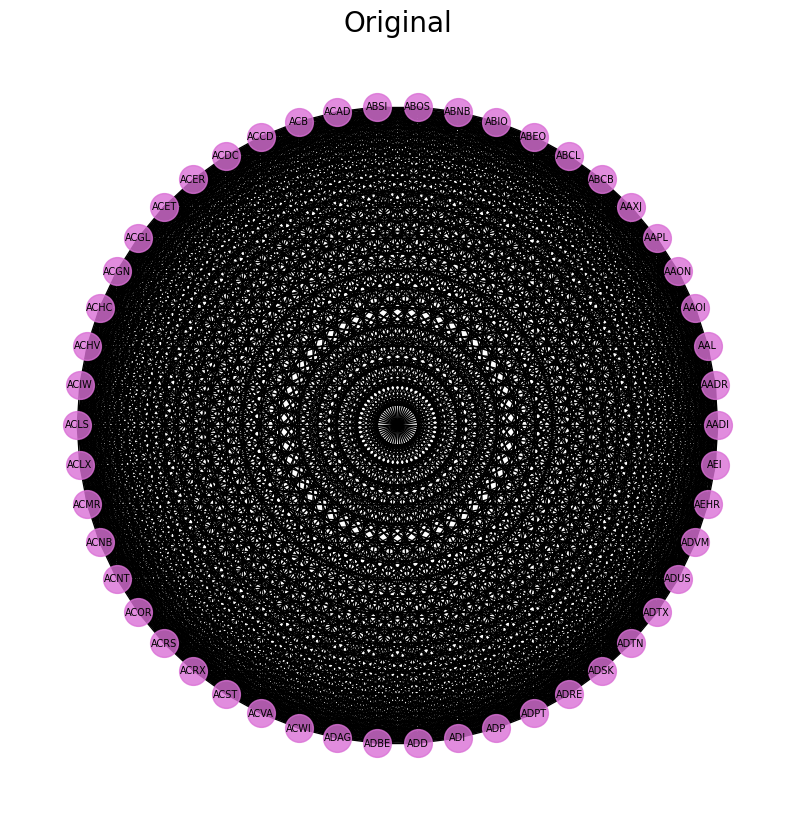

In [16]:
#neural network plot of first 50-stocks' correlation(original) 
def create_corr_network_1(G, title:str):
    #crates a list for edges and for the weights
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

    #positions
    positions=nx.circular_layout(G)
    
    #Figure size
    plt.figure(figsize=(10,10))

    #draws nodes
    nx.draw_networkx_nodes(G,positions,node_color='#DA70D6',
                           node_size=400,alpha=0.8)
    
    #Styling for labels
    nx.draw_networkx_labels(G, positions, font_size=7, 
                            font_family='sans-serif')
        
    #draws the edges
    nx.draw_networkx_edges(G,pos = positions, edgelist=edges, style='solid')
    
    plt.title(label=title,fontsize=20,color="black")
    # displays the graph without axis
    plt.axis('off')
    #saves image
    plt.savefig("part1.png", format="PNG")
    plt.show() 

create_corr_network_1(G,'Original')

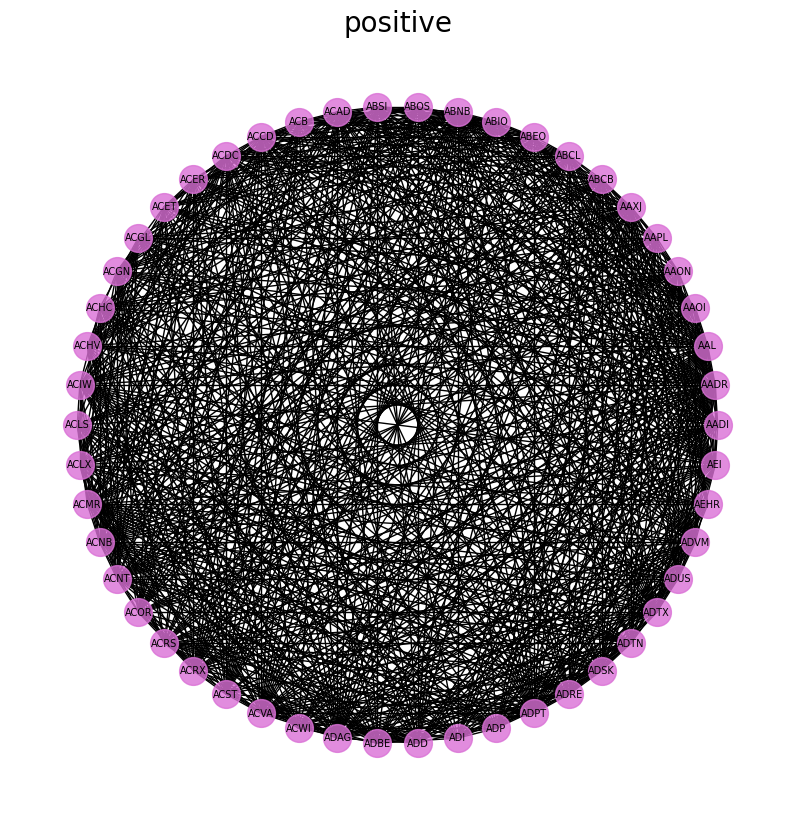

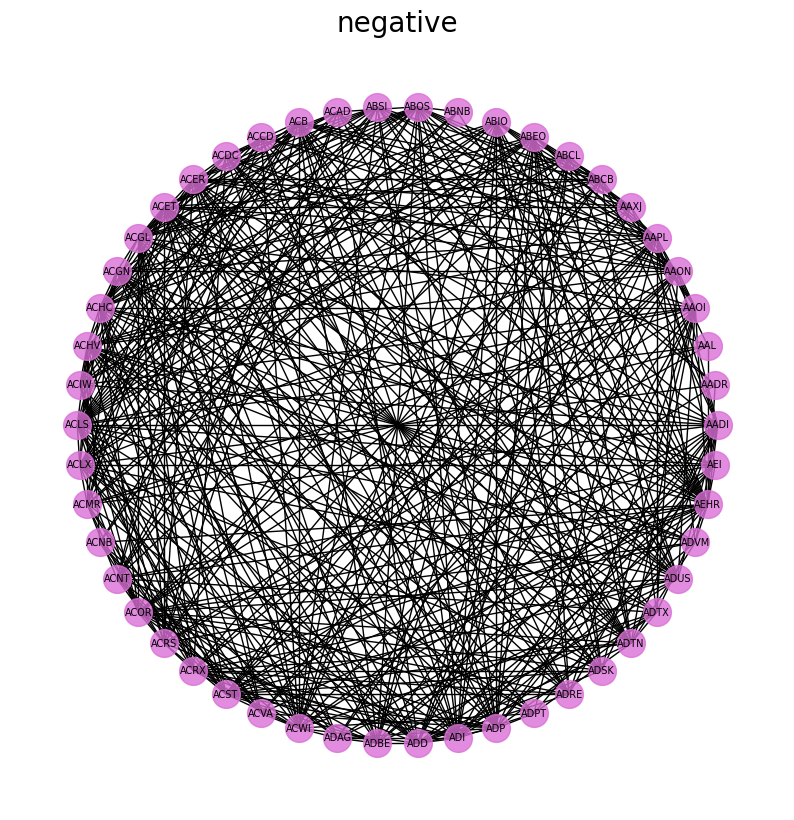

In [17]:
def create_corr_network_2(G, corr_direction):

    ##Creates a copy of the graph
    H = G.copy()

    ##Checks all the edges and removes some based on corr_direction
    for stock1, stock2, weight in G.edges(data=True):
        ##if we only want to see the positive correlations we then delete the edges with weight smaller than 0
        if corr_direction == "positive":
            if weight["weight"] <0:
                H.remove_edge(stock1, stock2)
        ##this part runs if the corr_direction is negative and removes edges with weights equal or largen than 0
        else:
            if weight["weight"] >=0:
                H.remove_edge(stock1, stock2)
    return H
                
H1 = create_corr_network_2(G,corr_direction='positive'); 
H2 = create_corr_network_2(G,corr_direction='negative'); 

create_corr_network_1(H1,'positive') 
create_corr_network_1(H2,'negative')

In [18]:
#function to create and display networks from the correlatin matrix. 

def create_corr_network_3(G, corr_direction, min_correlation):
    ##Creates a copy of the graph
    H = G.copy()
    
    ##Checks all the edges and removes some based on corr_direction
    for stock1, stock2, weight in G.edges(data=True):
        ##if we only want to see the positive correlations we then delete the edges with weight smaller than 0        
        if corr_direction == "positive":
            ####it adds a minimum value for correlation. 
            ####If correlation weaker than the min, then it deletes the edge
            if weight["weight"] <0 or weight["weight"] < min_correlation:
                H.remove_edge(stock1, stock2)
        ##this part runs if the corr_direction is negative and removes edges with weights equal or largen than 0
        else:
            ####it adds a minimum value for correlation. 
            ####If correlation weaker than the min, then it deletes the edge
            if weight["weight"] >=0 or weight["weight"] > min_correlation:
                H.remove_edge(stock1, stock2)
                
    
    #crates a list for edges and for the weights
    edges,weights = zip(*nx.get_edge_attributes(H,'weight').items())
    
    ### increases the value of weights, so that they are more visible in the graph
    weights = tuple([(1+abs(x))**2 for x in weights])
    
    #####calculates the degree of each node
    
    d = nx.degree(H)
    #####creates list of nodes and a list their degrees that will be used later for their sizes
    nodelist, node_sizes = zip(*d)

    #positions
    positions=nx.circular_layout(H)
    
    #Figure size
    plt.figure(figsize=(10,10))

    #draws nodes
    nx.draw_networkx_nodes(H,positions,node_color='#DA70D6',nodelist=nodelist,
                           #####the node size will be now based on its degree
                           node_size=tuple([x**3 for x in node_sizes]),alpha=0.8)
    
    #Styling for labels
    nx.draw_networkx_labels(H, positions, font_size=8, font_family='sans-serif')
    
    ###edge colors based on weight direction
    if corr_direction == "positive":
        edge_colour = plt.cm.GnBu 
    else:
        edge_colour = plt.cm.PuRd
        
    #draws the edges
    nx.draw_networkx_edges(H, positions, edgelist=edges,style='solid',
                          ###adds width=weights and edge_color = weights 
                          ###so that edges are based on the weight parameter 
                          ###edge_cmap is for the color scale based on the weight
                          ### edge_vmin and edge_vmax assign the min and max weights for the width
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))

    plt.title(label = corr_direction,fontsize=20,color="black")
    # displays the graph without axis
    plt.axis('off')
    #saves image
    plt.savefig("part5" + corr_direction + ".png", format="PNG")
    plt.show() 

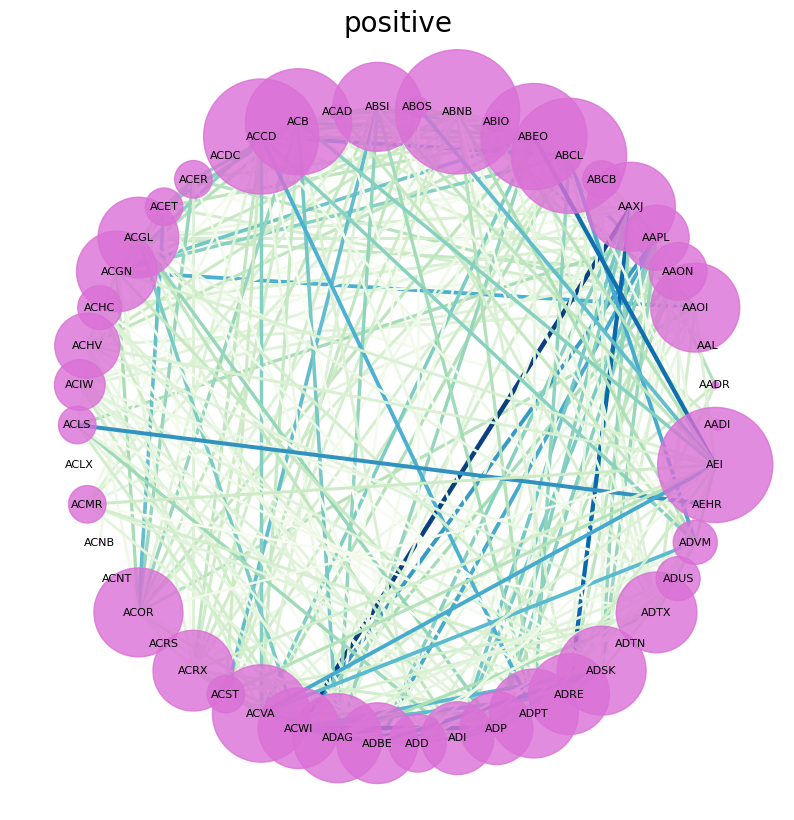

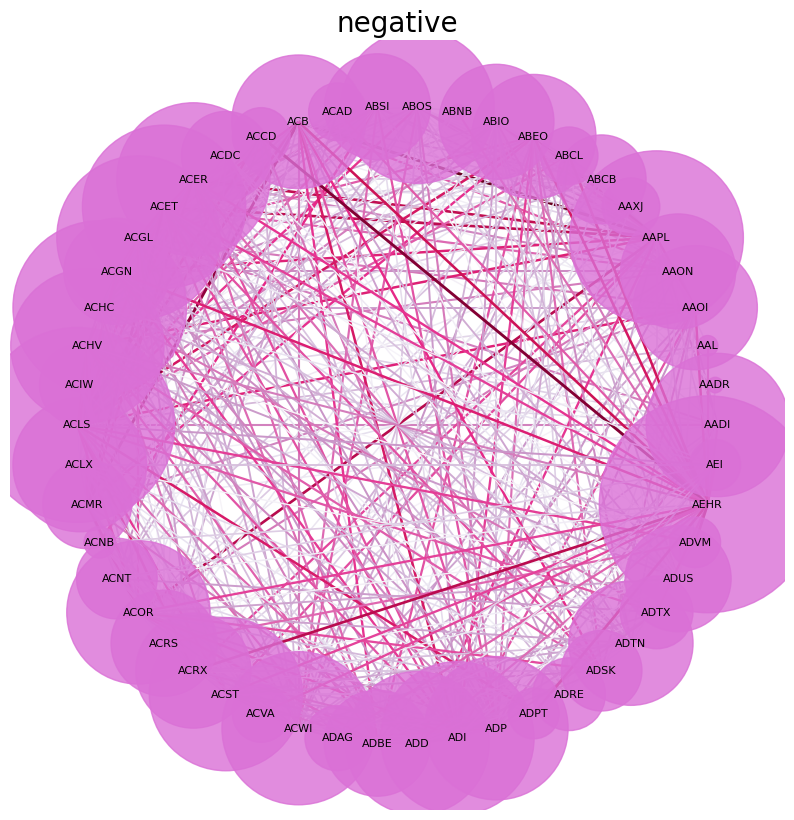

In [19]:
create_corr_network_3(G,corr_direction='positive',min_correlation = 0.35)
create_corr_network_3(G,corr_direction='negative',min_correlation = 0)

In [20]:



#part 3: model implementation




In [21]:
#choose stock market
#si.tickers_dow()
#si.tickers_nasdaq()
#lets try sp500
ticker_list2 = si.tickers_sp500();         
ticker_str2 = " ".join(ticker_list);

In [22]:
Multi_Stock_2 = yf.download(tickers=ticker_str2,period='5y',interval='1mo',rounding=True);

[*********************100%***********************]  5346 of 5346 completed

80 Failed downloads:
- HMACR: Period '5y' is invalid, must be one of ['1d', '5d']
- ATAKR: Period '5y' is invalid, must be one of ['1d', '5d']
- NOVVR: Period '5y' is invalid, must be one of ['1d', '5d']
- PEARW: Period '5y' is invalid, must be one of ['1d', '5d']
- IGTAR: Period '5y' is invalid, must be one of ['1d', '5d']
- LBBBR: Period '5y' is invalid, must be one of ['1d', '5d']
- AQUNR: Period '5y' is invalid, must be one of ['1d', '5d']
- GBRGR: Period '5y' is invalid, must be one of ['1d', '5d']
- ARIZR: Period '5y' is invalid, must be one of ['1d', '5d']
- HSPOR: Period '5y' is invalid, must be one of ['1d', '5d']
- FXCOR: Period '5y' is invalid, must be one of ['1d', '5d']
- MCAFR: Period '5y' is invalid, must be one of ['1d', '5d']
- BSGAR: Period '5y' is invalid, must be one of ['1d', '5d']
- KYCHR: Period '5y' is invalid, must be one of ['1d', '5d']
- ZXZZT: Period '5y' is invalid, must be one of [

In [23]:
#simple sieve
#get rid of unnecessary stocks(fluctuation is too small) by percentage(formula: (highest - lowest)/lowest within a month)
#not consecutive month but at least m months with a percentage larger than p in 5 years
#we set the percentage which is p to be 0.3 and at least m=25 months 
#return adjusted df_percentage and a list of unnecessary stocks
p=0.3; m=25;
df_percentage = (Multi_Stock_2['High']-Multi_Stock_2['Low'])/Multi_Stock_2['Low']; 
list_original = df_percentage.columns.values.tolist();
df_percentage = df_percentage.loc[:,(df_percentage >= p).sum() >= m];
df_percentage.dropna(axis = 0, how = 'all', inplace = True);#drop recent days which are NaN value at the bottom

list_adjusted = df_percentage.columns.values.tolist();
list_unnecessary = list(set(list_original) - set(list_adjusted));

In [24]:
df_percentage

,AACG,AADI,AAOI,ABEO,ABIO,ABUS,ABVC,ACB,ACER,ACET,...,Z,ZG,ZIVO,ZKIN,ZLAB,ZTEK,ZVRA,ZYME,ZYNE,ZYXI
Date,,,,,,,,,,,,,,,,,,,,,
2018-03-01,0.052941,0.111111,0.119736,0.178516,0.369565,0.136842,0.000000,0.192647,0.123272,0.479144,...,0.077882,0.072919,0.100000,0.076159,0.098687,0.060000,0.095890,0.178606,0.124700,0.263889
2018-04-01,0.078895,0.479290,0.531500,0.598837,0.413043,0.244898,0.000000,0.368322,0.180000,0.375615,...,0.176000,0.176572,0.375000,0.203993,0.281075,0.558824,0.632653,0.735776,0.446701,0.208791
2018-05-01,0.084000,0.270517,0.554485,0.379421,0.812500,0.216216,0.058201,0.235189,0.142286,0.530588,...,0.224995,0.225954,0.857143,0.083086,0.433613,0.270270,0.416298,0.653819,0.284698,0.420000
2018-06-01,0.315920,0.500000,0.243191,0.199346,0.372549,0.301724,0.000000,0.298869,0.223796,0.471261,...,0.151621,0.139324,0.727273,1.369085,0.135393,0.250000,0.265207,1.036517,0.332623,0.339552
2018-07-01,0.224138,0.110827,0.351424,0.305556,1.461538,0.650685,0.000000,0.462633,0.688943,1.511498,...,0.166393,0.166937,17.000000,0.479365,0.201809,0.333333,0.826667,0.297942,0.726825,0.217021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-01,0.211180,0.154412,0.415842,0.526154,0.183784,0.259740,0.215543,0.372881,0.270270,0.370301,...,0.385821,0.369565,0.236641,0.321429,0.676962,0.190141,0.351981,0.245364,0.560000,0.259740
2022-12-01,0.646018,0.152542,0.442933,0.743590,0.217822,0.277273,0.274194,0.802680,2.590551,1.761905,...,0.266238,0.282170,0.279167,1.286689,0.381341,0.451852,0.200980,0.611111,0.367347,0.111111
2023-01-01,0.213115,0.120833,0.393443,0.285141,0.244240,0.400000,2.116667,0.258824,0.521531,0.266846,...,0.393771,0.395807,0.694444,2.350000,0.633115,0.135714,0.415730,0.477428,0.346154,0.252723


In [25]:
#simple sieve
#stocks have at least n consecutive months with percentage larger than 25%
n = 4; x = 0.25; 
df_consecutive = df_percentage.loc[:, (df_percentage >= x).rolling(n).sum().eq(n).any()];
df_consecutive = df_consecutive[df_percentage >= x]
df_consecutive

,AACG,AADI,AAOI,ABEO,ABIO,ABUS,ABVC,ACB,ACER,ACET,...,Z,ZG,ZIVO,ZKIN,ZLAB,ZTEK,ZVRA,ZYME,ZYNE,ZYXI
Date,,,,,,,,,,,,,,,,,,,,,
2018-03-01,NaN,NaN,NaN,NaN,0.369565,NaN,NaN,NaN,NaN,0.479144,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.263889
2018-04-01,NaN,0.479290,0.531500,0.598837,0.413043,NaN,NaN,0.368322,NaN,0.375615,...,NaN,NaN,0.375000,NaN,0.281075,0.558824,0.632653,0.735776,0.446701,NaN
2018-05-01,NaN,0.270517,0.554485,0.379421,0.812500,NaN,NaN,NaN,NaN,0.530588,...,NaN,NaN,0.857143,NaN,0.433613,0.270270,0.416298,0.653819,0.284698,0.420000
2018-06-01,0.315920,0.500000,NaN,NaN,0.372549,0.301724,NaN,0.298869,NaN,0.471261,...,NaN,NaN,0.727273,1.369085,NaN,0.250000,0.265207,1.036517,0.332623,0.339552
2018-07-01,NaN,NaN,0.351424,0.305556,1.461538,0.650685,NaN,0.462633,0.688943,1.511498,...,NaN,NaN,17.000000,0.479365,NaN,0.333333,0.826667,0.297942,0.726825,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-01,NaN,NaN,0.415842,0.526154,NaN,0.259740,NaN,0.372881,0.270270,0.370301,...,0.385821,0.369565,NaN,0.321429,0.676962,NaN,0.351981,NaN,0.560000,0.259740
2022-12-01,0.646018,NaN,0.442933,0.743590,NaN,0.277273,0.274194,0.802680,2.590551,1.761905,...,0.266238,0.282170,0.279167,1.286689,0.381341,0.451852,NaN,0.611111,0.367347,NaN
2023-01-01,NaN,NaN,0.393443,0.285141,NaN,0.400000,2.116667,0.258824,0.521531,0.266846,...,0.393771,0.395807,0.694444,2.350000,0.633115,NaN,0.415730,0.477428,0.346154,0.252723


In [48]:
#build a dict containing target stocks' valuation measure
dow_list = si.tickers_dow();
dow_stats = {};
for ticker in dow_list:
    temp = si.get_stats_valuation(ticker);
    temp = temp.iloc[:,:2];
    temp.columns = ["Attribute", "Recent"];
    dow_stats[ticker] = temp;

In [58]:
dow_stats['AAPL']

,Attribute,Recent
0,Market Cap (intraday),2.45T
1,Enterprise Value,2.51T
2,Trailing P/E,26.32
3,Forward P/E,26.25
4,PEG Ratio (5 yr expected),2.62
5,Price/Sales (ttm),6.48
6,Price/Book (mrq),43.25
7,Enterprise Value/Revenue,6.48
8,Enterprise Value/EBITDA,19.63


In [50]:
#Price-to-Book Ratio of stocks in row stock market
combined_stats = pd.concat(dow_stats);
combined_stats = combined_stats.reset_index();
del combined_stats["level_1"]; #unnecessary column
# update column names
combined_stats.columns = ["Ticker", "Attribute", "Recent"];
pe_ratios = combined_stats[combined_stats["Attribute"]=="Price/Book (mrq)"].reset_index(); #change to another valuation
pe_ratios['Recent'] = pe_ratios['Recent'].astype(float); #important!!!! waste my 1.5 hours on this!!! without this step, the sort below does not work anyway!!!
pe_ratios_sorted = pe_ratios.sort_values('Recent',ascending=False);
pe_ratios_sorted;

In [51]:
#multi attributes and new ratio test
#Enterprise Value/Revenue and pb value
Attribute2 = combined_stats["Attribute"][combined_stats["Attribute"]=="Enterprise Value/Revenue"].reset_index(drop=True);
Recent2 = combined_stats["Recent"][combined_stats["Attribute"]=="Enterprise Value/Revenue"].reset_index(drop=True);
og = combined_stats[combined_stats["Attribute"]=="Price/Book (mrq)"].reset_index(drop=True);
multi_Attributes = og.assign(Attribute2 = Attribute2, Recent2 = Recent2);#change to another valuation
multi_Attributes['Recent'] = multi_Attributes['Recent'].astype(float); #important!!!! 
multi_Attributes['Recent2'] = multi_Attributes['Recent2'].astype(float); #important!!!! 
multi_sorted = multi_Attributes.sort_values(['Recent', 'Recent2'], ascending=[False,False]);
multi_sorted

,Ticker,Attribute,Recent,Attribute2,Recent2
11,HD,Price/Book (mrq),187.39,Enterprise Value/Revenue,2.16
0,AAPL,Price/Book (mrq),43.25,Enterprise Value/Revenue,6.48
1,AMGN,Price/Book (mrq),33.52,Enterprise Value/Revenue,5.79
26,V,Price/Book (mrq),12.37,Enterprise Value/Revenue,15.28
22,NKE,Price/Book (mrq),12.22,Enterprise Value/Revenue,3.84
21,MSFT,Price/Book (mrq),11.36,Enterprise Value/Revenue,10.00
17,KO,Price/Book (mrq),10.88,Enterprise Value/Revenue,6.74
23,PG,Price/Book (mrq),7.73,Enterprise Value/Revenue,4.56
12,HON,Price/Book (mrq),7.39,Enterprise Value/Revenue,3.77
4,CAT,Price/Book (mrq),7.00,Enterprise Value/Revenue,2.37


In [30]:
si.get_analysts_info('nflx')

{'Earnings Estimate':   Earnings Estimate  Current Qtr. (Mar 2023)  Next Qtr. (Jun 2023)  \
 0   No. of Analysts                    30.00                 29.00   
 1     Avg. Estimate                     2.85                  3.06   
 2      Low Estimate                     2.70                  2.53   
 3     High Estimate                     3.16                  3.91   
 4      Year Ago EPS                     3.53                  3.20   
 
    Current Year (2023)  Next Year (2024)  
 0                34.00             33.00  
 1                11.43             14.48  
 2                 9.50             11.62  
 3                12.95             17.13  
 4                 9.95             11.43  ,
 'Revenue Estimate':           Revenue Estimate Current Qtr. (Mar 2023) Next Qtr. (Jun 2023)  \
 0          No. of Analysts                      28                   26   
 1            Avg. Estimate                   8.17B                 8.5B   
 2             Low Estimate           

In [28]:
si.get_analysts_info('nflx')['Growth Estimates']

,Growth Estimates,NFLX,Industry,Sector(s),S&P 500
0,Current Qtr.,-19.30%,NaN,NaN,NaN
1,Next Qtr.,-4.40%,NaN,NaN,NaN
2,Current Year,14.90%,NaN,NaN,NaN
3,Next Year,26.70%,NaN,NaN,NaN
4,Next 5 Years (per annum),15.97%,NaN,NaN,NaN
5,Past 5 Years (per annum),32.55%,NaN,NaN,NaN


In [69]:

#Candlestick Price Chart


In [76]:
#single stock
company = 'AAPL'
df_Candlestick1 = yf.Ticker(company).history(period='5y',interval='1d')
fig = go.Figure(data=[go.Candlestick(x=df_Candlestick1.index, open=df_Candlestick1['Open'], high=df_Candlestick1['High'], low=df_Candlestick1['Low'], close=df_Candlestick1['Close'])])

fig.update_layout(title = f'{company}: Candlestick Price Chart', xaxis_tickfont_size = 14)
fig.update_layout(xaxis_rangeslider_visible = False)
    
fig.show()

In [77]:
#multi stocks
#simplified 
companys = ['QQQ', 'MSFT']; # Tickers to be analysed
companys_str = " ".join(companys);

fig = make_subplots(rows=1, cols=1,shared_xaxes=True,vertical_spacing=0.02)

for i in companys:
    df_Candlestick1 = yf.Ticker(i).history(period='5y',interval='1d');
    fig.add_trace(go.Candlestick(x=df_Candlestick1.index,open=df_Candlestick1['Open'],high=df_Candlestick1['High'],low=df_Candlestick1['Low'],close=df_Candlestick1['Close'],name=i),row=1,col=1)

    

fig.data[1].increasing.fillcolor = 'ORANGE'
fig.data[1].increasing.line.color = 'ORANGE'
fig.data[1].decreasing.fillcolor = 'BLACK' #blank: 'rgba(0,0,0,0)'
fig.data[1].decreasing.line.color = 'BLACK'



fig.update_layout(title = f'{companys_str}: Candlestick Price Chart', xaxis_tickfont_size = 14)
fig.update_layout(xaxis_rangeslider_visible = False)
    
fig.show()

In [78]:
#multi stocks
#manual replication 
company = 'QQQ MSFT'
df_Candlestick1 = yf.Ticker('QQQ').history(period='5y',interval='1d');
df_Candlestick2 = yf.Ticker('MSFT').history(period='5y',interval='1d');
fig = make_subplots(rows=1, cols=1,shared_xaxes=True,vertical_spacing=0.02)

fig.add_trace(go.Candlestick(x=df_Candlestick1.index,
                open=df_Candlestick1['Open'],
                high=df_Candlestick1['High'],
                low=df_Candlestick1['Low'],
                close=df_Candlestick1['Close'],name='QQQ'),
               row=1,col=1)

fig.add_trace(go.Candlestick(x=df_Candlestick2.index,
                open=df_Candlestick2['Open'],
                high=df_Candlestick2['High'],
                low=df_Candlestick2['Low'],
                close=df_Candlestick2['Close'],name='MSFT'),
               row=1,col=1)
fig.data[1].increasing.fillcolor = 'ORANGE'
fig.data[1].increasing.line.color = 'ORANGE'
fig.data[1].decreasing.fillcolor = 'BLACK' #blank: 'rgba(0,0,0,0)'
fig.data[1].decreasing.line.color = 'BLACK'

fig.update_layout(title = f'{company}: Candlestick Price Chart', xaxis_tickfont_size = 14)
fig.update_layout(xaxis_rangeslider_visible = False)
    
fig.show()


In [111]:
#candlestick and trending lines(volume-weighted average price)
stock = 'AAPL';
df = yf.Ticker(stock).history(start="2022-01-15", end="2022-07-15",interval="1h");
fig = go.Figure(data=[go.Candlestick(x=df.index,open=df['Open'],high=df['High'],low=df['Low'],close=df['Close'],name=stock)])
v = df['Volume'].values
tp = (df['Low'] + df['Close'] + df['High']).div(3).values
df = df.assign(vwap=((tp * v).cumsum() / v.cumsum()))
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,vertical_spacing=0.02)
fig.add_trace(go.Candlestick(x=df.index,open=df['Open'],high=df['High'],low=df['Low'],close=df['Close'],name=stock),row=1,col=1)

fig.add_trace(go.Scatter(x=df.index,y=df['vwap'],mode='lines',name='vwap',line=dict(color='royalblue',width=2)),row=2,col=1)
              
fig.update_layout(height=600, width=1000,title=f'{stock} & volume-weighted average price')
fig.show()


In [37]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

N=14
df = pd.DataFrame({'Open': np.random.randint(1,29,N),
                   'Close': np.random.randint(1,29,N),
                   'Low': np.random.randint(1,29,N),
                   'High': np.random.randint(1,29,N),
                   'Action': np.random.choice(['sell', 'buy'],N),
                   'System Quality Number': np.random.randint(1,29,N)})


def chart_strategy(df):
    fig = make_subplots(rows=3, cols=1)

    fig.add_trace(go.Candlestick(x = df.index,
                                open = df['Open'],
                                close = df['Close'],
                                low = df['Low'],
                                high = df['High']),
                 row = 1, col = 1)

    fig.add_trace(go.Scatter(x = df.index, y = df['System Quality Number']), 
                             row = 2, col = 1)

    fig.add_trace(go.Scatter(x = df.index, y = df['Action']), row = 3, col =1)

    fig.update_xaxes(row=1, col=1, rangeslider_thickness=0.05)
    fig.update_layout(width=900, height=900)

    return fig

chart_strategy(df)

In [38]:
dff = Ticker('MSFT AAPL').history(period='5y',interval='1d')
dff

open        high         low       close      volume  \
symbol date                                                                     
MSFT   2018-03-26   90.610001   94.000000   90.400002   93.779999  56396800.0   
       2018-03-27   94.940002   95.139999   88.510002   89.470001  56569000.0   
       2018-03-28   89.820000   91.230003   88.870003   89.389999  52501100.0   
       2018-03-29   90.180000   92.290001   88.400002   91.269997  45867500.0   
       2018-04-02   90.470001   90.879997   87.510002   88.519997  48515400.0   
...                       ...         ...         ...         ...         ...   
AAPL   2023-03-16  152.160004  156.460007  151.639999  155.850006  76161100.0   
       2023-03-17  156.080002  156.740005  154.279999  155.000000  98862500.0   
       2023-03-20  155.070007  157.820007  154.149994  157.399994  73641400.0   
       2023-03-21  157.320007  159.399994  156.539993  159.279999  73938300.0   
       2023-03-22  159.300003  162.139999  157.809998  157.830002  69165700.0   

                     adjclose  dividends  splits  
symbol date                                       
MSFT   2018-03-26   89.895889        0.0     0.0  
       2018-03-27   85.764412        0.0     0.0  
       2018-03-28   85.687714        0.0     0.0  
       2018-03-29   87.489861        0.0     0.0  
       2018-04-02   84.853752        0.0     0.0  
...                       ...        ...     ...  
AAPL   2023-03-16  155.850006        0.0     0.0  
       2023-03-17  155.000000        0.0     0.0  
       2023-03-20  157.399994        0.0     0.0  
       2023-03-21  159.279999        0.0     0.0  
       2023-03-22  157.830002        0.0     0.0  

[2514 rows x 8 columns]

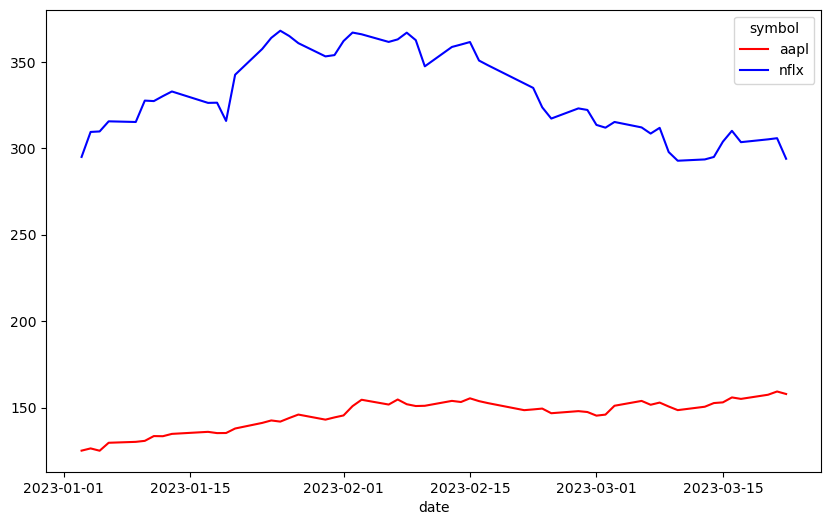

In [39]:
tickers = Ticker('aapl nflx', asynchronous=True)
df_company = tickers.history()
df_pivot = df_company.reset_index().pivot(index='date', columns='symbol', values='adjclose')
df_pivot;
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.lineplot(data=df_pivot, palette=['r','b'], dashes=False)

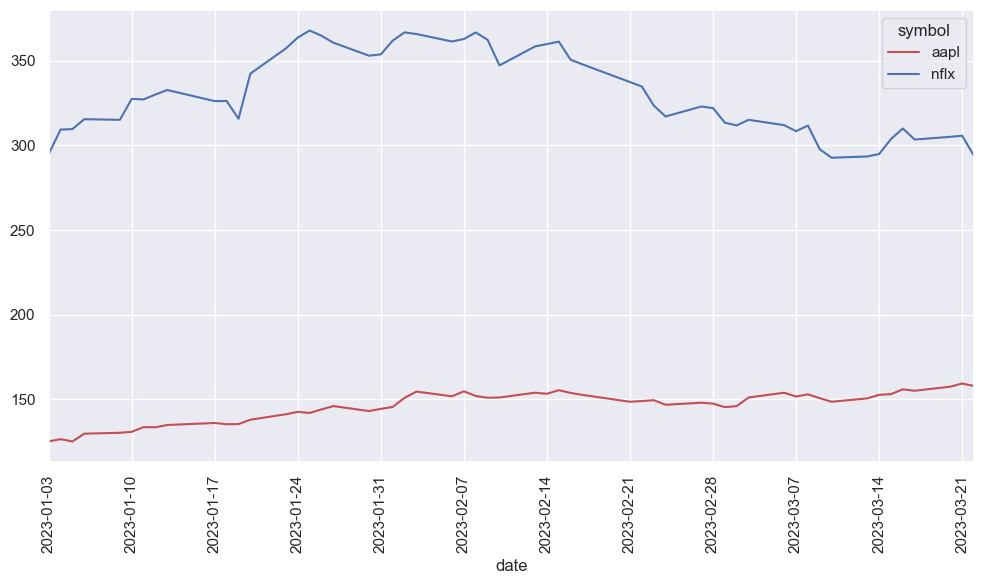

In [40]:
import pandas as pd
from yahooquery import Ticker

tickers = Ticker('aapl nflx', asynchronous=True)
df_company = tickers.history()

df_pivot = df_company.reset_index().pivot(index='date', columns='symbol', values='adjclose')
import matplotlib.pyplot as plt
import matplotlib.dates as md
import matplotlib.ticker as mtick

import seaborn as sns
sns.set_theme()

fig, ax = plt.subplots(figsize=(10,6))

ax = sns.lineplot(data=df_pivot, palette=['r','b'], dashes=False)

# adjust axes for readability
ax.xaxis.set_major_locator(md.WeekdayLocator(byweekday = 1))
ax.set_xlim(df_pivot.index.min(), df_pivot.index.max())
ax.yaxis.set_major_locator(mtick.MultipleLocator(50))

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

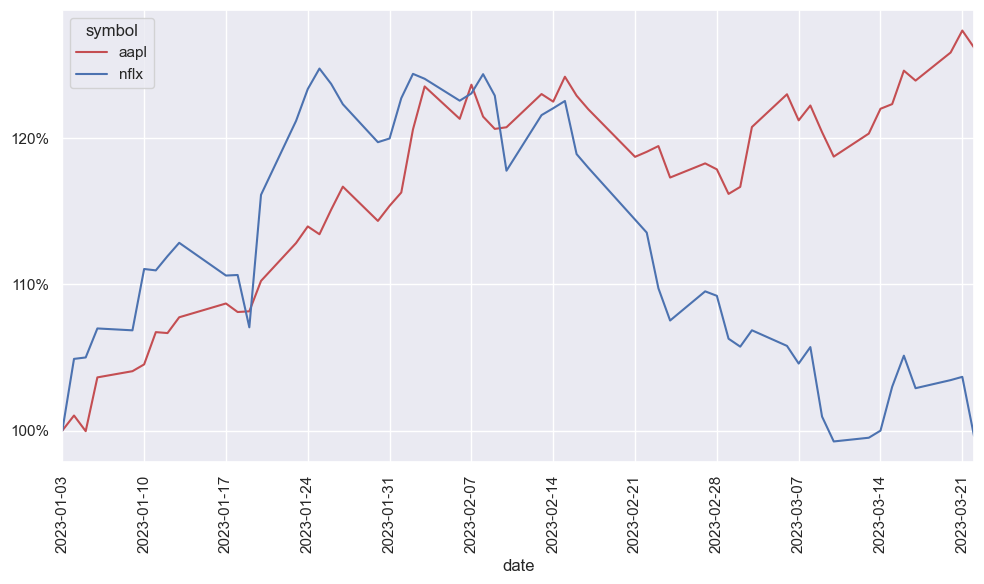

In [41]:
df_pivot_perc = df_pivot.div(df_pivot.iloc[0,:]).mul(100)
fig, ax = plt.subplots(figsize=(10,6))

ax = sns.lineplot(data=df_pivot_perc, palette=['r','b'], dashes=False)
ax.xaxis.set_major_locator(md.WeekdayLocator(byweekday = 1))
ax.set_xlim(df_pivot.index.min(), df_pivot.index.max())

fmt = '%.0f%%'
yticks = mtick.FormatStrFormatter(fmt)
ax.yaxis.set_major_formatter(yticks)
ax.yaxis.set_major_locator(mtick.MultipleLocator(10))

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [43]:
dff

open        high         low  \
symbol date                                                            
MSFT   2018-03-22                  91.269997   91.750000   89.660004   
       2018-03-23                  89.500000   90.459999   87.080002   
       2018-03-26                  90.610001   94.000000   90.400002   
       2018-03-27                  94.940002   95.139999   88.510002   
       2018-03-28                  89.820000   91.230003   88.870003   
...                                      ...         ...         ...   
       2023-03-15                 259.980011  266.480011  259.209991   
       2023-03-16                 265.209991  276.559998  263.279999   
       2023-03-17                 278.260010  283.329987  276.320007   
       2023-03-20                 276.980011  277.480011  269.850006   
       2023-03-21 16:00:04-04:00  274.880005  274.950012  269.529999   

                                       close    volume    adjclose  dividends  
symbol date                                                                    
MSFT   2018-03-22                  89.790001  38604700   84.741531        0.0  
       2018-03-23                  87.180000  44068900   82.278275        0.0  
       2018-03-26                  93.779999  56396800   88.507210        0.0  
       2018-03-27                  89.470001  56569000   84.439514        0.0  
       2018-03-28                  89.389999  52501100   84.364021        0.0  
...                                      ...       ...         ...        ...  
       2023-03-15                 265.440002  46028000  265.440002        0.0  
       2023-03-16                 276.200012  54768800  276.200012        0.0  
       2023-03-17                 279.429993  69492200  279.429993        0.0  
       2023-03-20                 272.230011  43466600  272.230011        0.0  
       2023-03-21 16:00:04-04:00  273.779999  32485178  273.779999        0.0  

[1258 rows x 7 columns]

In [ ]:
#https://subscription.packtpub.com/book/data/9781789618518/4/ch04lvl1sec26/implementing-the-fama-french-three-factor-model-in-python

In [81]:
from pandas_datareader.famafrench import get_available_datasets
import pandas_datareader.data as web

In [91]:
ff_dict = web.DataReader('F-F_Research_Data_Factors', 'famafrench', 
                         start='2014-01-01')

In [92]:
ff_dict

{0:          Mkt-RF   SMB   HML    RF
 Date                             
 2014-01   -3.32  0.90 -2.07  0.00
 2014-02    4.65  0.37 -0.31  0.00
 2014-03    0.43 -1.85  4.93  0.00
 2014-04   -0.19 -4.20  1.17  0.00
 2014-05    2.06 -1.88 -0.13  0.00
 ...         ...   ...   ...   ...
 2022-09   -9.35 -0.79  0.06  0.19
 2022-10    7.83  0.09  8.05  0.23
 2022-11    4.60 -3.40  1.38  0.29
 2022-12   -6.41 -0.68  1.32  0.33
 2023-01    6.65  5.03 -4.08  0.35
 
 [109 rows x 4 columns],
 1:       Mkt-RF    SMB    HML    RF
 Date                            
 2014   11.71  -7.86  -1.45  0.02
 2015    0.09  -3.99  -9.65  0.02
 2016   13.30   6.66  22.75  0.20
 2017   21.51  -4.97 -13.51  0.80
 2018   -6.95  -3.21  -9.73  1.83
 2019   28.28  -6.11 -10.34  2.15
 2020   23.66  13.18 -46.56  0.45
 2021   23.56  -3.89  25.53  0.04
 2022  -21.60  -6.82  25.80  1.43,
 'DESCR': 'F-F Research Data Factors\n-------------------------\n\nThis file was created by CMPT_ME_BEME_RETS using the 202301 CRSP datab

In [93]:
ff_dict.keys()

dict_keys([0, 1, 'DESCR'])

In [94]:
print(ff_dict['DESCR'])

F-F Research Data Factors
-------------------------

This file was created by CMPT_ME_BEME_RETS using the 202301 CRSP database. The 1-month TBill return is from Ibbotson and Associates, Inc. Copyright 2023 Kenneth R. French

  0 : (109 rows x 4 cols)
  1 : Annual Factors: January-December (9 rows x 4 cols)


In [96]:
ff_dict[0].head()

TypeError: unhashable type: 'slice'

In [ ]:
#fama-french-multi-factor-models
#https://www.quantconnect.com/learning/articles/introduction-to-financial-python/fama-french-multi-factor-models

In [24]:
#https://yahooquery.dpguthrie.com/guide/ticker/financials/
#https://finance.yahoo.com/quote/AAPL/balance-sheet/
Market Price per Share = Current market price of the share
Book Value per Share = (Total assets - intangible assets - total liabilities) ÷ number of outstanding shares
Market Price per Share/Book Value per Share

SyntaxError: invalid syntax (756052767.py, line 1)

In [ ]:
#the lower a company's price-to-book ratio is, the higher price to sales ratio, the higher pe ratio and the lower PEG ratio 

In [94]:
aapl = Ticker('aacg')
aapl.quotes;

In [35]:
aapl = Ticker('aapl')
aapl.valuation_measures

'Valuation data unavailable for aapl'

In [28]:
aapl = Ticker('aapl')
types = ['TotalDebt','GoodwillAndOtherIntangibleAssets']
A=aapl.get_financial_data('GoodwillAndOtherIntangibleAssets',frequency='q', trailing=False)
A

'Cash Flow data unavailable for aapl'

In [ ]:
#machine learning
#https://www.youtube.com/watch?v=AXBhrLongC8

In [79]:
A=(Multi_Stock_2['High']-Multi_Stock_2['Low'])/Multi_Stock_2['Low'];
B=df_percentage.loc[:,(df_percentage >= x).sum() >= 20]
C=B.columns.values.tolist()
D = df_percentage.columns.values.tolist()
list(set(D) - set(C))

['OTRK', 'CEMI', 'BNGO', 'SLS', 'STAF']

In [56]:
OTRK=yf.download(tickers='ZIONP',period='5y',interval='1d',rounding=True)

[*********************100%***********************]  1 of 1 completed


In [57]:
((OTRK['High']-OTRK['Low'])>1).sum()

60

In [35]:
idx = pd.date_range("2018-01-01", periods=10, freq="M")

df_2 = pd.DataFrame(
    {
        'A':[0, 0.4, 0.5, 0.3, 0,0,0,0,0,0],
        'B':[0, 0.6, 0.8,0, 0.3, 0.3, 0.9, 0.7,0,0],
        'C':[0,0,0.5, 0.4, 0.4, 0.2,0,0,0,0],
        'D':[0.4,0, 0.6, 0.5, 0.7, 0.2,0, 0.9, 0.8,0],
        'E':[0.4, 0.3, 0.2, 0.7, 0.7, 0.8,0,0,0,0],
        'F':[0,0,0.6, 0.7,0.8, 0.3, 0.4, 0.1,0,0]
    },
    index=idx
)



df_2

,A,B,C,D,E,F
2018-01-31,0.0,0.0,0.0,0.4,0.4,0.0
2018-02-28,0.4,0.6,0.0,0.0,0.3,0.0
2018-03-31,0.5,0.8,0.5,0.6,0.2,0.6
2018-04-30,0.3,0.0,0.4,0.5,0.7,0.7
2018-05-31,0.0,0.3,0.4,0.7,0.7,0.8
2018-06-30,0.0,0.3,0.2,0.2,0.8,0.3
2018-07-31,0.0,0.9,0.0,0.0,0.0,0.4
2018-08-31,0.0,0.7,0.0,0.9,0.0,0.1
2018-09-30,0.0,0.0,0.0,0.8,0.0,0.0
2018-10-31,0.0,0.0,0.0,0.0,0.0,0.0


In [37]:
df_2.loc[:, (df_2 >= 0.5).rolling(3).sum().eq(3).any()]

,D,E,F
2018-01-31,0.4,0.4,0.0
2018-02-28,0.0,0.3,0.0
2018-03-31,0.6,0.2,0.6
2018-04-30,0.5,0.7,0.7
2018-05-31,0.7,0.7,0.8
2018-06-30,0.2,0.8,0.3
2018-07-31,0.0,0.0,0.4
2018-08-31,0.9,0.0,0.1
2018-09-30,0.8,0.0,0.0
2018-10-31,0.0,0.0,0.0


In [55]:
df_consecutive = pd.DataFrame();
df_consecutive.insert(0, '0' , df_2.iloc[:,0], True);
df_column = df_2.columns.values.tolist();
for i in range(len(df_column)):
    for k, v in df_2[:,i][df_2.iloc[:,i] > 0.3].groupby((df_2.iloc[:,i] <= 0.3)):
        df_consecutive.insert(i+1, df_column[i] , v, True)
df_consecutive.drop(df_consecutive.columns[0], axis=1)
df_consecutive

InvalidIndexError: (slice(None, None, None), 0)

In [46]:
df_consecutive = df_2.iloc[:,0]
df_consecutive

KeyError: 0

In [57]:
df_2.iloc[:,0]
consecutive = lambda x: df_2.iloc[:,x][df_2.iloc[:,x] > 0.3].groupby((df_2.iloc[:,x] <= 0.3))
map(consecutive,[1, 2, 3])


In [35]:
for k, v in (lambda x: df_2.iloc[:,x][df_2.iloc[:,x] > 0.3].groupby((df_2.iloc[:,x] <= 0.3).cumsum()))([1,2]):
    print(v)

ValueError: Grouper for '<class 'pandas.core.frame.DataFrame'>' not 1-dimensional

In [162]:
df[df['value'] == 0].groupby((df['value'] != 0).cumsum())

KeyError: 'value'

In [ ]:
#consecutive months
#range >7%
df_consecutive = pd.DataFrame();
df_consecutive.insert(0, '0' , df_percentage.iloc[:,0], True);
df_column = df_percentage.columns.values.tolist();
for i in range(len(df_column)):
    for k, v in df_percentage.iloc[:,i][df_percentage.iloc[:,i] > 0.6].groupby((df_percentage.iloc[:,i] <= 0.6).cumsum()):
        df_consecutive.insert(i+1, df_column[i] , v, True)
df_consecutive.drop(df_consecutive.columns[0], axis=1)
df_consecutive

In [ ]:
#cointegration

In [113]:
#log return
Each_Stock['Log returns'] = np.log(Each_Stock['Close']/data['Close'].shift());
#target company financial data

#not working

NameError: name 'Each_Stock' is not defined

In [114]:
aapl=yf.Ticker('aapl')
aapl.get_financials()

Exception: yfinance failed to decrypt Yahoo data response

In [ ]:
### increases the value of weights, so that they are more visible in the graph
weights = tuple([(1+abs(x))**2 for x in weights])

###edge colors based on weight direction
if corr_direction == "positive":
    edge_colour = plt.cm.GnBu 
else:
    edge_colour = plt.cm.PuRd

#draws the edges
nx.draw_networkx_edges(H, positions, edge_list=edges,style='solid',
                      ###adds width=weights and edge_color = weights 
                      ###so that edges are based on the weight parameter 
                      ###edge_cmap is for the color scale based on the weight
                      ### edge_vmin and edge_vmax assign the min and max weights for the width
                      width=weights, edge_color = weights, edge_cmap = edge_colour,
                      edge_vmin = min(weights), edge_vmax=max(weights))

In [ ]:
def create_corr_network(G, corr_direction, min_correlation):

    ...

##Checks all the edges and removes some based on corr_direction
for stock1, stock2, weight in G.edges_iter(data=True):
    ##if we only want to see the positive correlations we then delete the edges with weight smaller than 0        
    if corr_direction == "positive":
        ####it adds a minimum value for correlation. 
        ####If correlation weaker than the min, then it deletes the edge
        if weight["weight"] <0 or weight["weight"] < min_correlation:
            H.remove_edge(stock1, stock2)
    ##this part runs if the corr_direction is negative and removes edges with weights equal or largen than 0
    else:
        ####it adds a minimum value for correlation. 
        ####If correlation weaker than the min, then it deletes the edge
        if weight["weight"] >=0 or weight["weight"] > min_correlation:
            H.remove_edge(stock1, stock2)

In [ ]:
#####calculates the degree of each node
d = nx.degree(H)
#####creates list of nodes and a list their degrees that will be used later for their sizes
nodelist, node_sizes = zip(*d.items())

#draws nodes
nx.draw_networkx_nodes(H,positions,node_color='#DA70D6',nodelist=nodelist,
                       #####the node size will be now based on its degree
                       node_size=tuple([x**3 for x in node_sizes]),alpha=0.8)